In [1]:
# Lucas Lukasavicus Silva
# PPG-PO (ITA/UNIFESP) - Modelagem de Investimento e Risco

# Aplicação do Framework CAPM para Títulos de Fundos de Investimento Imobiliário (FIIs)

> O Framework CAPM tem como base a Teoria Moderna de Portifólios que determina que o risco de um portifólio deve ser menor ou igual ao risco de cada componente individual. A partir dessa observação é possível concluir que a diversificação pode ser uma boa estratégia para a redução do risco não-sistemico dos seus investimentos.
No presente trabalho buscamos utilizar esse framework para comparar 3 carteiras de investimentos de fundos de investimentos imobiliários (FIIs), através de diferentes métricas e indicadores.
Como conclusão pudemos observar que o entendimento amplo desses indicadores apresenta um instrumento importante de análise de ativos e investimento para redução dos riscos associados ao processo de investimento.

## 1. Introdução

O objetivo de todo investidor é aplicar seu dinheiro em uma dada operação para obter lucro depois de um período de tempo. O emprego desses valores pode gerar lucro ou prejuízo dependendo do cenário macroeconomico, de indicadores da economia local, da expectativa dos demais investidores, da especulação de mercado e de diversos outros fatores intrínsecos e extrínsecos à atividade economica. A medida de probabilida de perda de um determinado investimento é chamada de risco. Esse risco pode vir da desacelaração economica, pela ausencia de matéria-prima, pela inflação, por questões políticas e sociais.
Como todos investimentos estão sujeitos à essas situações, sabemos que em todo investimento temos riscos.

Esses riscos podem ser classificados em duas categorias:

- Risco sistemico (risco que afeta a economia como um todo, por exemplo, a situação economica de um país, pandemias, guerras, falta de suprimentos, problemas na cadeia logística e etc) e;
- Risco não-sistemico (risco inerentes a uma empresa ou setor específico da economia, como por exemplo a entrada de um novo competidor no mercado, queda da safra de uma determinada commoditie entre outros).

Dentre esses o risco não-sistémico é aquele que podemos diminuir (porém, não mitigar) através de estratégias de diversificação.

## 2. Revisão da Literatura

Em 1952 Harry Markowitz divulgou em seu trabalho a Teoria Moderna de Portifólios (MPT - Modern Portfolio Theory), na qual ele propunha um modelo de média-variancia que permitia calcular e otimizar o valor esperado de retorno de uma carteira de investimentos através do cálculo dessas medidas estatísticas baseadas no valores históricos dos ativos que compõem essas carteiras.
O trabalho de Markowitz deu origem a uma série de outros trabalhos (Sharpe, Konno e Yamazaki) que desenvolveram métodos de otimização para o mesmo problema ou se basearam nessa teoria para desenvolver métricas (como o Índice de Sharpe) e frameworks (como o Value-at-Risk (VaR) e o Capital Asset Pricing Model (CAPM)).

## 3. Materiais e Dados Utilizados

Como base para o desenvolvimento desse trabalho utilizamos os notebooks desenvolvidos em aula pelo Professor Renato Cesar Sato.
Além disso como base de dados utilizamos os dados de FIIs coletados a partir do site [Fiis.com.br](https://fiis.com.br/).
Para realizar essa coleta desenvolvemos um _Web Crawler_, que é um mecanismo automático para pesquisar informações através de um site e coletar os dados de uma maneira estruturada.

Os dados coletados são os `dados históricos` de todos os fundos que compõem o IFIX (Índice de Fundos Imobiliários criado pela B3), com o histórico de `preços` e `retornos` de aproximadamente `5 anos`.

Utilizamos um arquivo (`IFIXDia_17-07-23.csv`) que foi extraído do site da própria [B3](https://www.b3.com.br/pt_br/market-data-e-indices/indices/indices-de-segmentos-e-setoriais/indice-fundos-de-investimentos-imobiliarios-ifix-composicao-da-carteira.htm).

Notebooks das aulas foram usados para essas análises:

- [x] [Analise de Dados das Ações (e visualização)](https://colab.research.google.com/drive/1FacYoypWhN0GcINRvB5twEjQOABJMNSc#scrollTo=uhW6OMmg5mGa)


- [x] [Alocação dos Ativos na Carteira e Análise Estatística)](https://colab.research.google.com/drive/18MHexlXjpONCOvw-3R2ML3G8rIDtYpMY)


- [x] [CAPM](https://colab.research.google.com/drive/1-CLXlAFzXAJAH3D2U9wiWjm5lfLNkrTW)


### 3.1 Pre-Processamento de Dados

- Nessa etapa iremos coletar os dados dos preços dos últimos 5 anos dos papeis que compõem o IFIX.
- Note que o IFIX mudou ao longo desse tempo, porém estamos considerando a carteira do dia 17/07/2023.
- Após isso, consideramos 3 carteiras recomendadas: Itau, BTG e Primo Rico.
- Ignoramos o balanceamento dentro das carteiras pois nem todos os papeis dessas carteiras pertecem ao IFIX.

In [2]:
# Import Third-party Libs

import pandas as pd

In [3]:
# Import Own Libs

from pre_processing import main as pp
from helper import portfolio_assemble, normalize, calculate_daily_return, calculate_sharpe_ratio, calculate_capm
import plot_data as pld

In [4]:
# PRE_PROCESSING DATA

# Read data from IFIX and consolidate all assets' prices from IFIX through the last 5 years

prices_df = pp('IFIXDia_17-07-23.csv')
del prices_df['Unnamed: 0']

In [5]:
# Define portfolios
PORTFOLIOS = {
    'BTG' : 
    {
            'assets' : ['MCCI11', 'KNSC11', 'RBRY11', 'KNCR11', 'RBRF11', 'PVBI11', 'BDIF11', 'KDIF11', 'BTAG11', 'RURA11', 'CPTR11'],
        #     'weights' : [10, 10, 10, 15, 10, 5, 10, 10, 5, 5, 10],
    },

    'PRIMO_RICO' : 
    {
            'assets' : ['ALZR11', 'HGLG11', 'KNRI11', 'BCFF11'],
        #     'weights' : [25, 25, 25, 25],
    },

    'ITAU' : 
    {
            'assets' : ['HGRU11', 'VILG11', 'BRCO11', 'LVBI11', 'RBRP11', 'PVBL11', 'HSML11', 'HGCR11', 'KNCR11', 'KNIP11', 'KNHY11'],
        #     'weights' : [10, 5, 10, 10, 10, 5, 5, 11.25, 11.25, 11.25, 11.25],
    }
}


In [6]:
prices_df_temp = prices_df.copy()
cols = [c.replace('_price', '') for c in prices_df.columns]
prices_df_temp.columns = cols

# ---------------------------------------------------------------------------

btg_in_ifix = [c for c in PORTFOLIOS['BTG']['assets'] if (c in prices_df_temp.columns)]
primo_rico_in_ifix = [c for c in PORTFOLIOS['PRIMO_RICO']['assets'] if (c in prices_df_temp.columns)]
itau_in_ifix = [c for c in PORTFOLIOS['ITAU']['assets'] if (c in prices_df_temp.columns)]

In [7]:
btg_df = portfolio_assemble(prices_df_temp, btg_in_ifix)
primo_rico_df = portfolio_assemble(prices_df_temp, primo_rico_in_ifix)
itau_df = portfolio_assemble(prices_df_temp, itau_in_ifix)

In [8]:
btg_df['BTG'] = btg_df['portfolio']
primo_rico_df['PRIMO_RICO'] = primo_rico_df['portfolio']
del primo_rico_df['date']
itau_df['ITAU'] = itau_df['portfolio']
del itau_df['date']


df_portfolio = pd.concat([btg_df, primo_rico_df, itau_df], axis=1)
del df_portfolio['portfolio']

df_portfolio['IFIXm'] = prices_df_temp['IFIX'] / len(prices_df_temp.columns) - 2 # excluding date and ifix columns

df_portfolio.head(15)

,date,BTG,PRIMO_RICO,ITAU,IFIXm
0,2018-07-16,33.683333,110.7375,32.006,53.893759
1,2018-07-17,33.860000,111.4650,31.995,54.186303
2,2018-07-18,34.080000,110.6525,32.038,53.122819
3,2018-07-19,34.101667,111.1925,32.090,53.652483
4,2018-07-20,33.993333,110.9000,32.110,53.666773
5,2018-07-23,34.076667,110.9225,32.185,53.732693
6,2018-07-24,34.180000,111.2875,32.093,53.506478
7,2018-07-25,33.933333,111.1800,32.600,53.801622
8,2018-07-26,34.018333,111.1750,32.202,53.585733
9,2018-07-27,34.241667,111.1350,43.394,55.661425


### 3.2 Análise de Dados

Nessa seção vamos analisar os dados coletados para as carteiras baseadas no IFIX

In [9]:
pld.show_plot(prices_df, 'Historico de Preços (Todos os Papeis)')

In [10]:
pld.show_plot(df_portfolio, 'Historico de Preços (Carteiras)')

In [11]:
pld.show_plot(normalize(df_portfolio), 'Historico de Preços (Carteiras) - Normalizados')

Quando comparamos as carteiras com os preços originais, temos a impressão que a carteira _'PRIMO_RICO'_ parece ser a melhor. Porém, quando analisamos as mesmas carteiras de forma normalizada, vemos que temos os maiores ganhos com a carteira do _ITAU_.

In [12]:
# DAILY RETURNS
prices_daily_return = calculate_daily_return(prices_df)

pld.show_plot(prices_daily_return, "Retornos Diários - Preços")
# prices_daily_returnW

In [13]:
# DAILY RETURNS
portfolio_daily_return = calculate_daily_return(df_portfolio)

pld.show_plot(portfolio_daily_return, "Retornos Diários - Portfolio")
# prices_daily_returnW

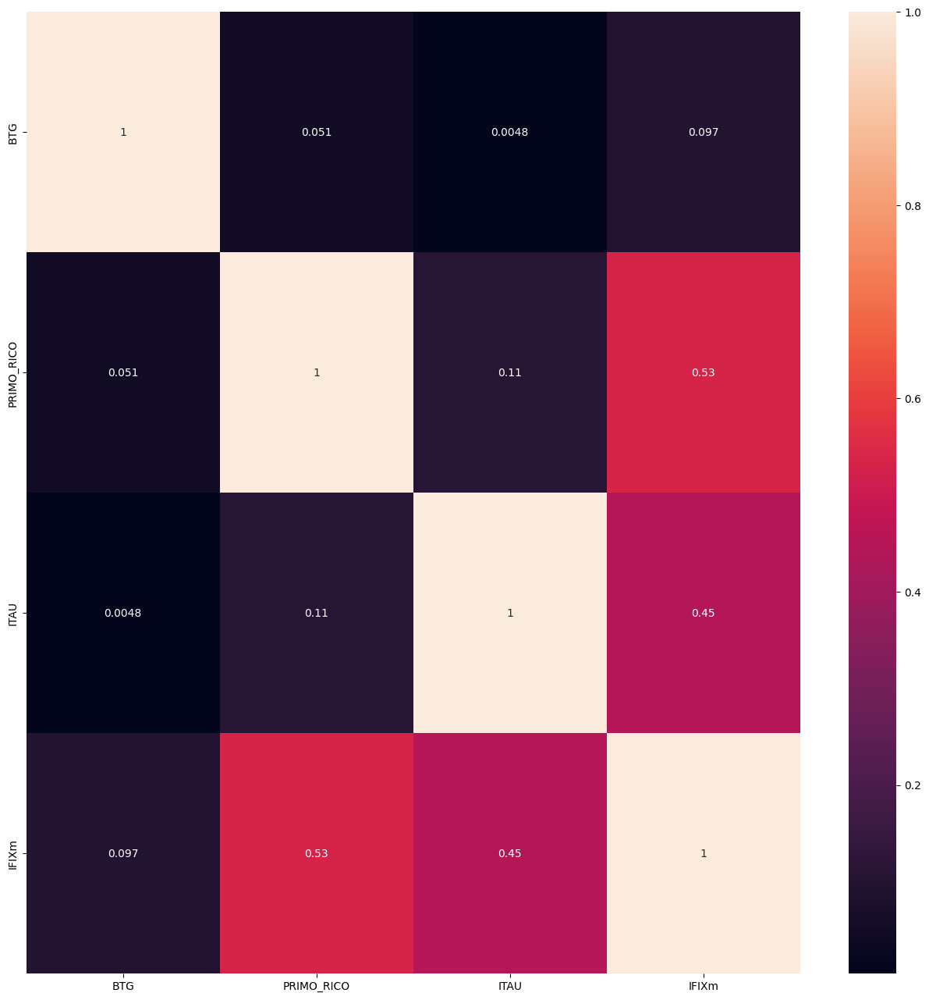

In [14]:
pld.show_correlation(portfolio_daily_return)

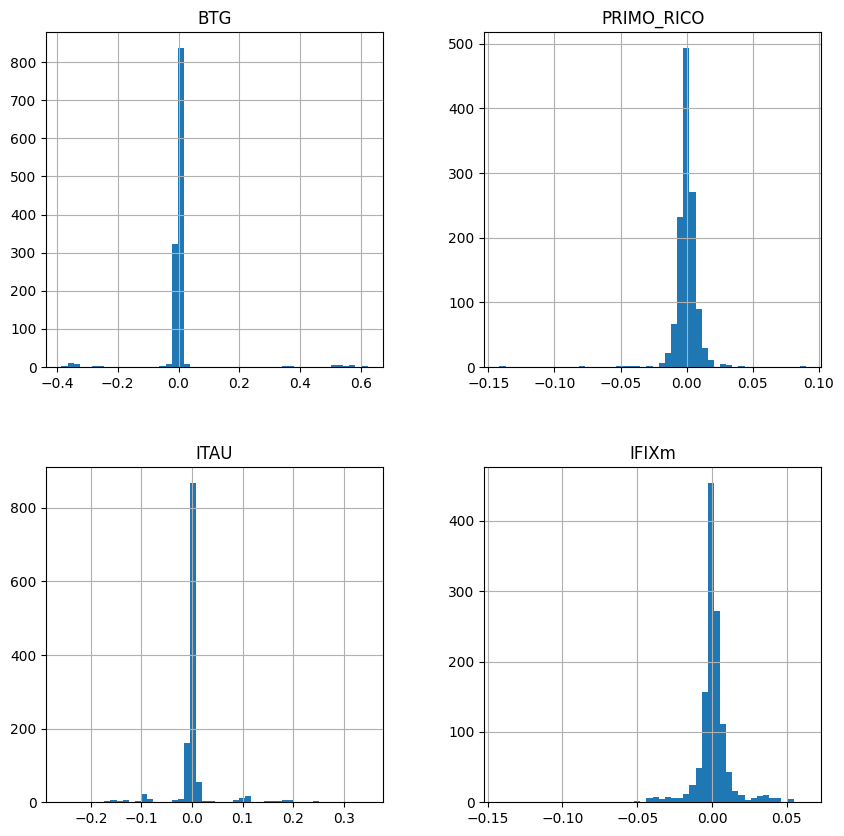

In [15]:
# prices_daily_return.hist(figsize=(10,10),bins=50);
# pld.show_hist(prices_daily_return, (10,10), 50)

pld.show_hist(portfolio_daily_return, (10,10), 50)

Com essa visualização podemos ver que as carteiras de forma geral tem uma maior concentração (por conta da "cintura" do histograma), enquanto que o indicador IFIX tem menor concentração.
Essa leitura confirma nossa intuição, uma vez que o IFIX é composto por muito mais ativos do que cada carteira.

O próximo gráfico mostra esse mesmo cenário, porém com os dados sobrepostos.

In [16]:
pld.show_distplot(portfolio_daily_return);

> Conclusões após a análise de dados inicial:

- Pelos gráficos dos valores históricos das carteiras, pudemos observar o aumento do preço ao longo do tempo. A partir da análise dos valores normalizados também pudemos ver que a carteira do _Itau_ foi a que teve maior valorização. Contudo através da análise de retornos diários, vimos que nenhuma das carteiras obteve muito destaque ao longo do tempo, uma hipótese que poderia explicar isso, é o fato da remuneração dos FIIs ser diferente da remuneração de outros ativos como ações. No caso dos fundos de investimento imobiliários, temos o rendimento dado através do pagamento mensal (na maioria dos ativos dessa classe) de um valor de "aluguel". Sendo assim, o retorno do papel se dá através do pagamento desses redimentos ao invés da sua valorização ao longo do tempo. Por fim, nessa análise inicial pudemos observar o quanto as carteiras são correlacionadas, com destaque para a carteira do _Primo Rico_ que teve maior correlação com o IFIX, provavelmente devido ao fato dessa carteira ser composta por menos ativos e ativos com maior expressão (maior peso) dentro do índice. A última análise dessa seção focou em entender o comportamento das medidas estatísticas de média e variancia de todas as carteiras, onde pudemos observar que o IFIX tem a maior variancia. Essa observação é interessante pois ainda que podemos ter maior diversificação do risco através da composição de uma carteira mais ampla (o IFIX representa uma carteira teórica com mais de 100 ativos de FIIs), ao mesmo tempo temos que nos atentar a variação dos preços desses ativos.

---

### 3.3 Análise Economica

Nessa seção iremos usar métricas economicas para determinar o comportamento das carteiras e análisa-las em diferentes cenários ao longo do tempo.

Uma forma de analisar as carteiras é verificando métricsa como `retorno médio` e `retorno acumulado`:

In [17]:
pdr = portfolio_daily_return[['IFIXm', 'ITAU', 'BTG', 'PRIMO_RICO']]

pdr.head(10)

,IFIXm,ITAU,BTG,PRIMO_RICO
0,NaN,NaN,NaN,NaN
1,0.005428,-0.000344,0.005245,0.006570
2,-0.019626,0.001344,0.006497,-0.007289
3,0.009971,0.001623,0.000636,0.004880
4,0.000266,0.000623,-0.003177,-0.002631
5,0.001228,0.002336,0.002451,0.000203
6,-0.004210,-0.002858,0.003032,0.003291
7,0.005516,0.015798,-0.007217,-0.000966
8,-0.004013,-0.012209,0.002505,-0.000045
9,0.038736,0.347556,0.006565,-0.000360


In [18]:
pdr.mean()

IFIXm         0.000439
ITAU          0.002028
BTG           0.004867
PRIMO_RICO    0.000159
dtype: float64

In [19]:
# portfolio_daily_return[['IFIXm', 'ITAU', 'BTG', 'PRIMO_RICO']].sum(axis=1)
cumulative_returns = (pdr + 1).prod() - 1

cumulative_returns

IFIXm         0.564418
ITAU          2.176592
BTG           1.778427
PRIMO_RICO    0.161124
dtype: float64

Outra métrica importante para compararmos o comportamento das carteiras é o `Sharpe Ratio`. O `Índice de Sharpe` é um indicador que permite avaliar a relação risco _x_ retorno de um investimento ou carteira.
O Índice de Sharpe é calculado com base nos valores do retorno dos papéis que compõem uma determinada carteira.
A sua interpretação é:
- Valores positivos: Indicam que a carteira tem um rendimento que compensa o seu risco.
- Valores negativos: Indicam que a carteira tem um rendimento que **não** compensa o seu risco.

Leia "compensar" o risco como: A carteira paga valores superiores ao de uma carteira com _"risco zero"_. Nesse caso, esse risco é teórico, porque não existe nenhum ativo que não possua risco. Porém, tomemos como base títulos de Tesouro Direto do Governo Brasileiro, o risco desse investimento é o chamado _"risco-país"_, porque esse título só irá ter prejuízo em caso de calote do Governo Brasileiro.


In [20]:
calculate_sharpe_ratio(pdr)

IFIXm         0.560779
ITAU          0.680308
BTG           0.820437
PRIMO_RICO    0.290550
dtype: float64

### 3.4 CAPM

O CAPM (Capital Asset Portfolio Management) é um framework que visa avaliar qual deveria ser a taxa de um determinado investimento para que esse investimento valesse o risco associado. Em termos matemáticos, o CAPM é dado como:

$ E(R_i) = R_f + \beta_im * (E(R_m) - R_f) $

Onde temos:

- $E(R_i)$ - Retorno esperado do ativo
- $R_f$ - Taxa de Juros livre de risco
- $\beta_im$ - coeficiente utilizado como forma de medir a sensibilidade dos retornos do ativo com relação aos retornos do mercado;
- $E(R_m)$ - Retorno esperado do mercado


Utilizando o CAPM podemos medir o quanto uma carteira pode trazer de retorno, pois ele produz o retorno esperado.
Aplicando esse framework às nossas carteiras temos:

In [21]:
pdr

,IFIXm,ITAU,BTG,PRIMO_RICO
0,NaN,NaN,NaN,NaN
1,0.005428,-0.000344,0.005245,0.006570
2,-0.019626,0.001344,0.006497,-0.007289
3,0.009971,0.001623,0.000636,0.004880
4,0.000266,0.000623,-0.003177,-0.002631
...,...,...,...,...
1236,-0.003479,-0.008450,-0.003741,0.004221
1237,0.000877,-0.000927,-0.004446,0.003661
1238,-0.001065,0.001392,0.000427,-0.004786
1239,-0.000451,0.001035,-0.002650,-0.000039


In [22]:
metrics = []
# for portfolio in PORTFOLIOS.keys():
for portfolio in pdr.columns:
    er, a, b = calculate_capm(pdr['IFIXm'], pdr[portfolio])
    metrics.append({'portfolio' : portfolio, 'expected_return' : er, 'alpha' : a, 'beta' : b})

In [23]:
mdf = pd.DataFrame(metrics)
mdf

,portfolio,expected_return,alpha,beta
0,IFIXm,0.110723,-1.679867e-18,1.000000
1,ITAU,0.189116,1.277683e-03,1.708020
2,BTG,0.081355,4.543780e-03,0.734769
3,PRIMO_RICO,0.041360,-5.073182e-06,0.373546


In [24]:
# PLACING ALL METRICS TOGETHER
mdf['mean_return'] = list(pdr.mean())
mdf['cumulative_return'] = list(cumulative_returns)
mdf['sharpe_ratio'] = list(calculate_sharpe_ratio(pdr))

In [25]:
mdf

,portfolio,expected_return,alpha,beta,mean_return,cumulative_return,sharpe_ratio
0,IFIXm,0.110723,-1.679867e-18,1.000000,0.000439,0.564418,0.560779
1,ITAU,0.189116,1.277683e-03,1.708020,0.002028,2.176592,0.680308
2,BTG,0.081355,4.543780e-03,0.734769,0.004867,1.778427,0.820437
3,PRIMO_RICO,0.041360,-5.073182e-06,0.373546,0.000159,0.161124,0.290550


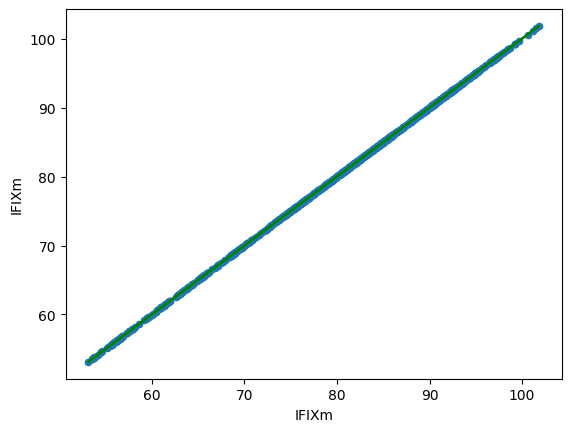

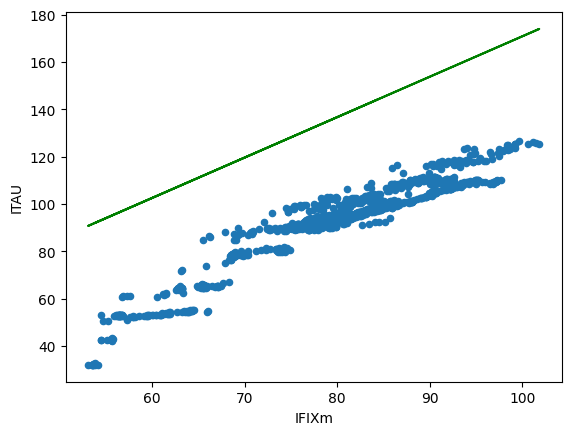

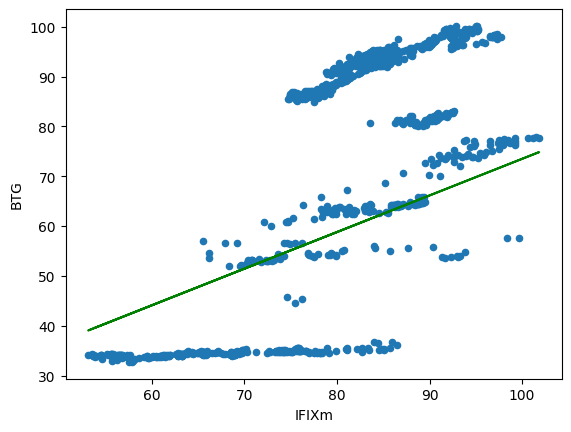

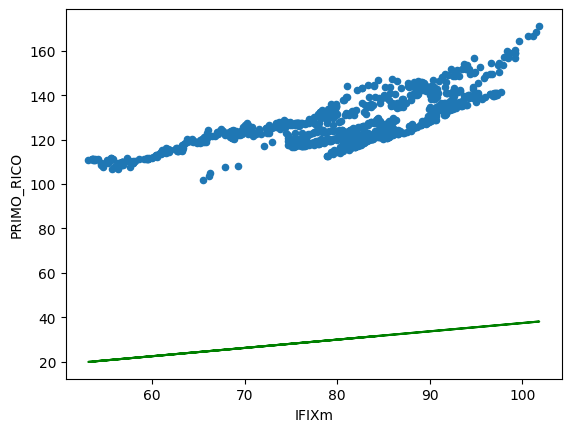

In [26]:
# for p in PORTFOLIOS.keys():
    # pld.show_scatter_base_vs_asset(df_portfolio, 'IFIXm', p)

for i, row in mdf.iterrows():
    pld.show_scatter_base_vs_asset_with_trendline(df_portfolio, 'IFIXm', row['portfolio'], row['alpha'], row['beta'])

Final conclusions:


---

# Resultados

Após todas as análises chegamos a tabela de `métricas` das carteiras:

In [27]:
mdf

,portfolio,expected_return,alpha,beta,mean_return,cumulative_return,sharpe_ratio
0,IFIXm,0.110723,-1.679867e-18,1.000000,0.000439,0.564418,0.560779
1,ITAU,0.189116,1.277683e-03,1.708020,0.002028,2.176592,0.680308
2,BTG,0.081355,4.543780e-03,0.734769,0.004867,1.778427,0.820437
3,PRIMO_RICO,0.041360,-5.073182e-06,0.373546,0.000159,0.161124,0.290550


Através das análises que fizemos e da tabelas que obtivemos após a aplicação de diversas técnicas e métricas, podemos ver que a carteira do _Itau_ é a que possui o maior valor esperado de retorno. Ela também apresenta o maior retorno acumulativo, isso mostra a solidez histórica dessa carteira, o que pode ser confirmado quando anaisamos o gráfico da média e variancia dessa carteira. Ainda assim, a carteira do BTG apresenta o maior Índice de Sharpe, o que poderia dizer que essa carteira tem um perfil de risco mais ajustado dentro do período analisado.
Essas análises em conjunto podem munir investidores de diferentes perfis de valiosas informações que podem ajuda-los a compor uma carteira mais balanceada e ajustada dentro dos seus objetivos pessoais.

# Discussão e Limitações da Pesquisa

Essa pesquisa é ainda bastante preliminar pois utiliza ainda um conjunto de dados bastante limitado (cerca de 100 ativos de FIIs). Podemos introduzir mais ativos e compará-los com outras métricas (CDI, Selic, IPCA, IGP-M e etc). Além disso seria interessante comparar as métricas e frameworks explorados nessa pesquisa contra outros frameworks clássicos (CVaR) e métricas (índice de Treynor, Sortino, Omega, Calmar e etc).

# Bibliografia Utilizada


- [1] MARKOWITZ, H. Portfolio selection. The Journal of Finance, v. 7, n. 1, p. 77-91, 1952.
- [2] SHARPE, W. F. Capital asset prices: A theory of market equilibrium under conditions of risk. The Journal of Finance, v. 19, n. 3, p. 425-442, 1964.

- Links:
    - [B3 - cotação IFIX](https://www.infomoney.com.br/cotacoes/b3/indice/ifix/historico/#page2)
    - [B3 - cotação IFIX - Histórico](https://www.b3.com.br/pt_br/market-data-e-indices/indices/indices-de-segmentos-e-setoriais/indice-fundos-de-investimentos-imobiliarios-ifix-estatisticas-historicas.htm)
    - [S&P 500 Index: What It’s for and Why It’s Important in Investing](https://www.investopedia.com/terms/s/sp500.asp#:~:text=The%20S%26P%20is%20a%20float,even%20the%20entire%20equities%20market.);
    - [Sharpe Ratio](https://www.investopedia.com/terms/s/sharperatio.asp)
    - [S&P500](https://portfolioslab.com/portfolio/sp-500)
    - [Calculation on Sharpe Ratio](https://www.investopedia.com/ask/answers/010815/how-do-you-calculate-sharpe-ratio-excel.asp)
    - [Carteira FIIs - Primo Rico](https://fiis.com.br/noticias/fundos-imobiliarios-da-carteira-do-primo-rico/)
    - [Carteira FIIs - BTG](https://content.btgpactual.com/research/carteiras-recomendadas/carteira-recomendada/64abf195bf7c0333b38ff2b3/Top-Fundos-Julho-23)
    - [Carteira FIIs - Itau](https://www.itaucorretora.com.br/assessoria/carteira-recomendada-de-fundos-imobiliarios.aspx?ma)
    - [CAPM](https://www.financestrategists.com/wealth-management/valuation/capital-asset-pricing-model/)
    - [CAPM - termo](https://www.investopedia.com/terms/c/capm.asp)
    - [VaR e CVaR](https://www.ise.ufl.edu/uryasev/files/2011/11/VaR_vs_CVaR_CARISMA_conference_2010.pdf)
    - [PortfoliosLab](https://portfolioslab.com/)